In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sb
import numpy as np
import altair as alt
from altair import Chart
import folium
from folium.plugins import HeatMap
import scripts 
from scripts import *
plt.style.use('seaborn')

# Load the Data

In [4]:
data = pd.read_csv('./data/US_Accidents_June20.csv')
cal_data = data[data['State']=='CA']

# Weather Analysis

### Visibility Severity

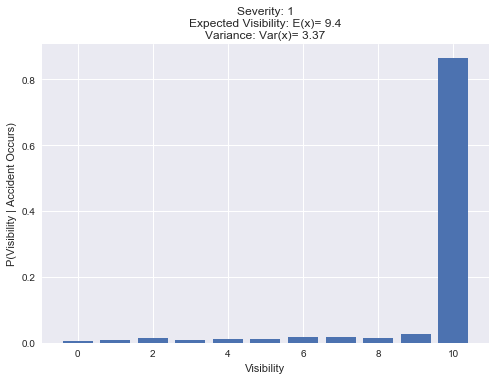

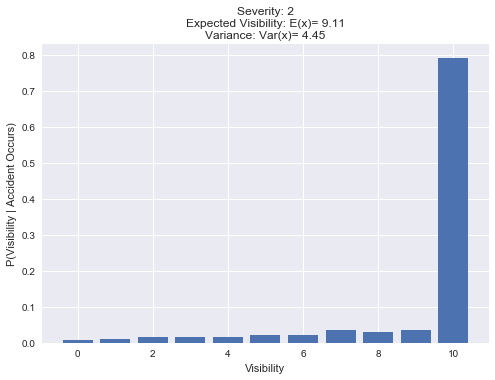

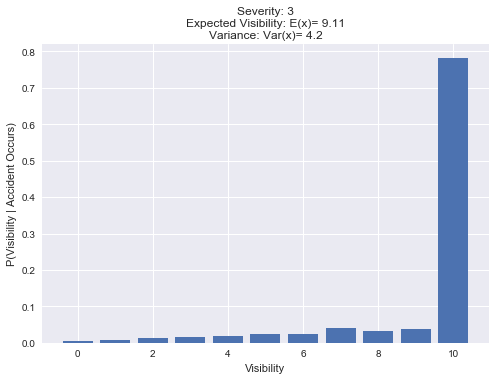

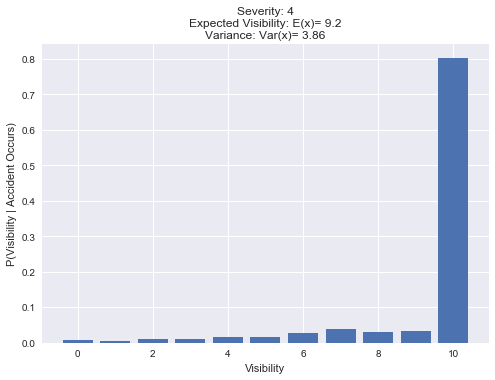

<Figure size 576x396 with 0 Axes>

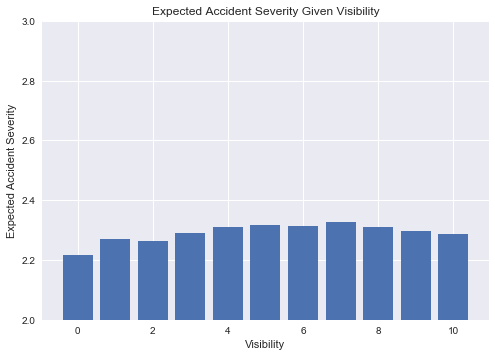

In [5]:
plot_for_weather.plot_visibility(cal_data,'./pics/weather/visibility.png')

### Temperature Severity

Temperature mean: 62.66394019349165


C:\Users\linkx\.conda\envs\py36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


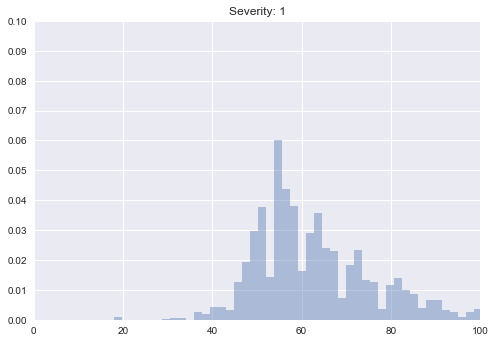

Temperature mean: 64.7921787133788


C:\Users\linkx\.conda\envs\py36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


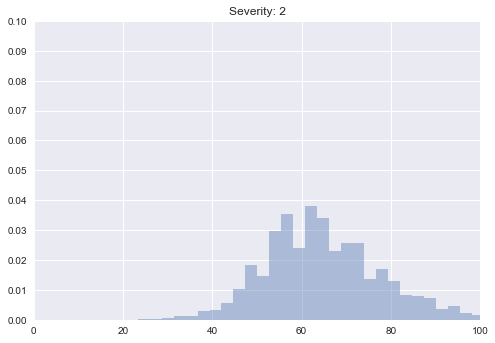

Temperature mean: 65.52975833008264


C:\Users\linkx\.conda\envs\py36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


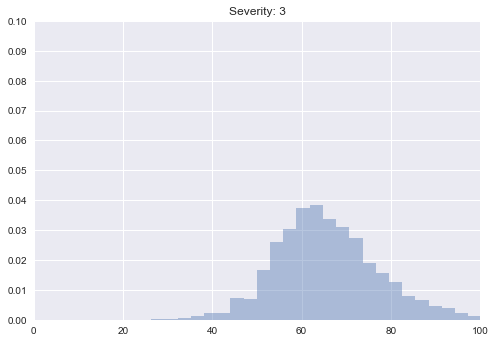

Temperature mean: 63.95126551472378


C:\Users\linkx\.conda\envs\py36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


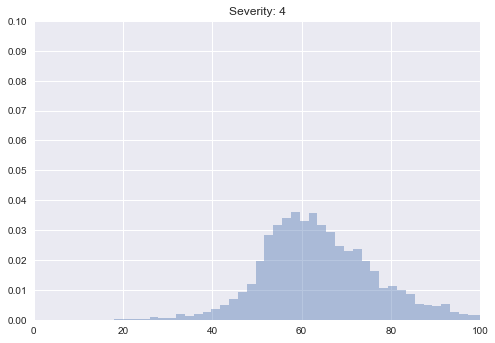

In [6]:
plot_for_weather.plot_tem(cal_data,'./pics/weather/')

# Time Analysis

### Month

C:\Users\linkx\Desktop\ECE143-project\scripts\plot_for_time.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Start_Time']=pd.to_datetime(data['Start_Time'])


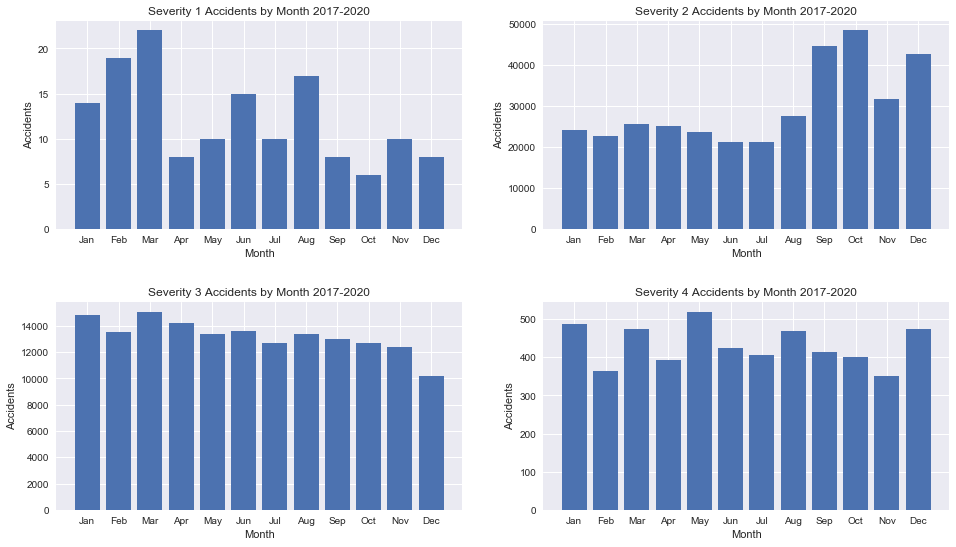

<Figure size 576x396 with 0 Axes>

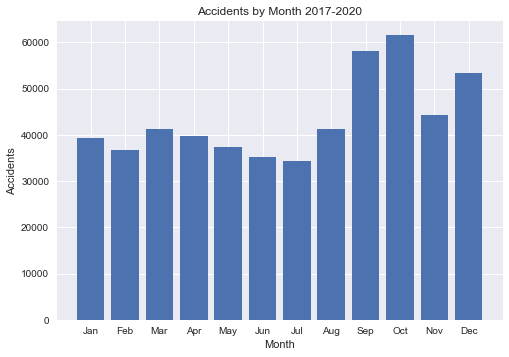

<Figure size 576x396 with 0 Axes>

In [7]:
plot_for_time.plot_month(cal_data,'./pics/time/month.png')

### Week

C:\Users\linkx\Desktop\ECE143-project\scripts\plot_for_time.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Start_Time']=pd.to_datetime(data['Start_Time'])


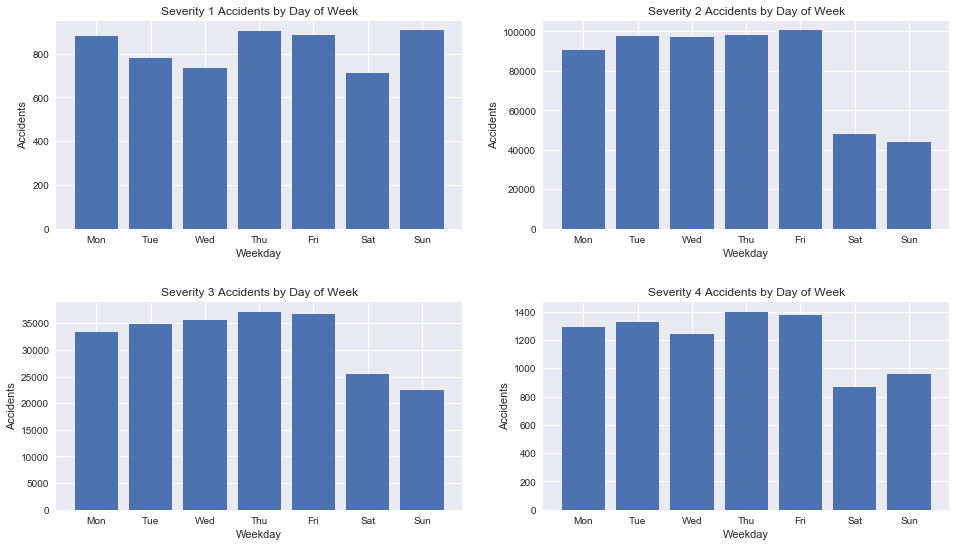

<Figure size 576x396 with 0 Axes>

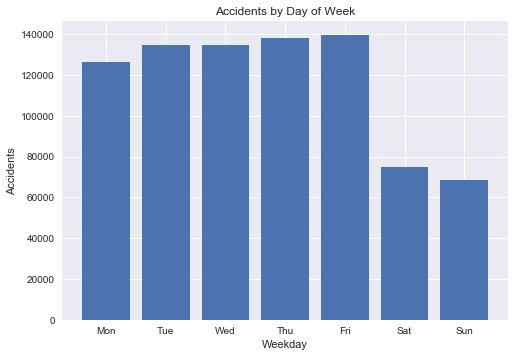

<Figure size 576x396 with 0 Axes>

In [8]:
plot_for_time.plot_week(cal_data,'./pics/time/week.png')

### Day

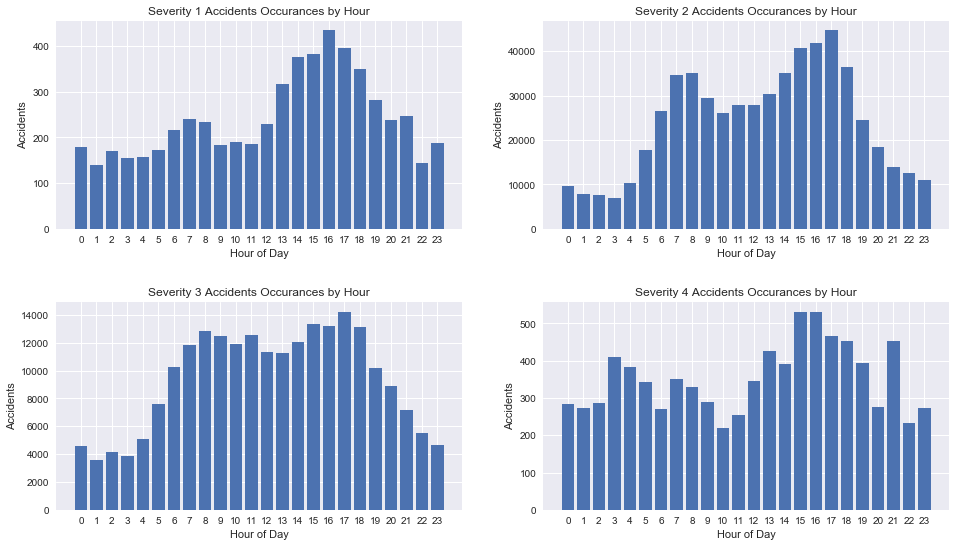

<Figure size 576x396 with 0 Axes>

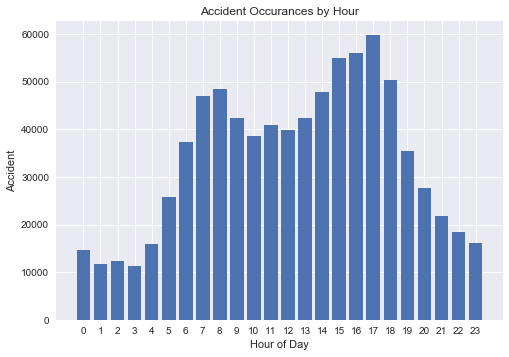

<Figure size 576x396 with 0 Axes>

In [9]:
plot_for_time.plot_day(cal_data,'./pics/time/day.png')

# High Risk Location Analysis

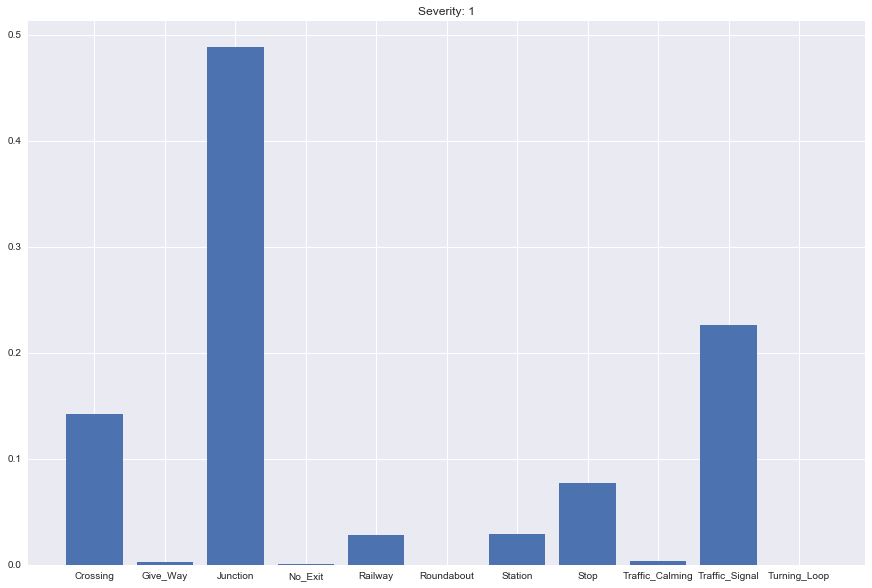

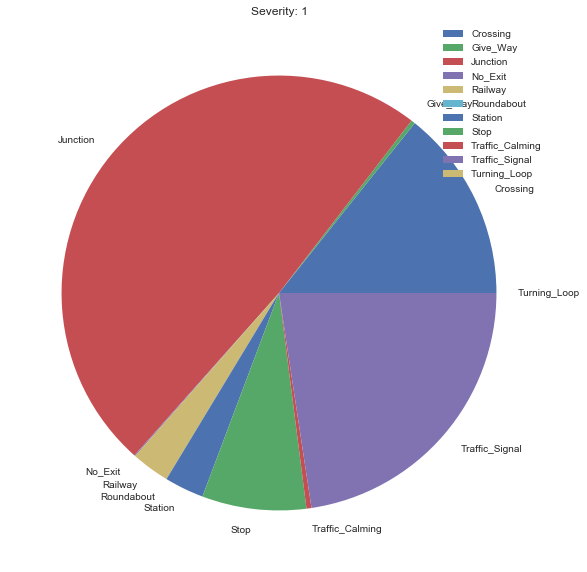

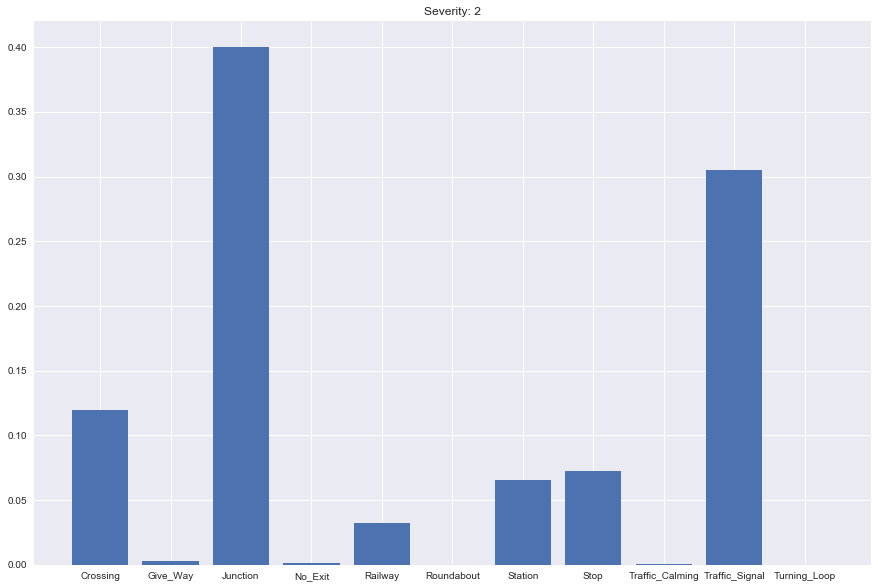

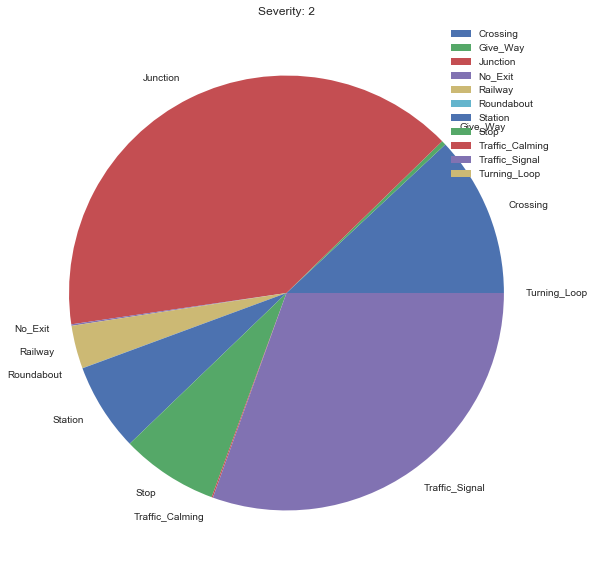

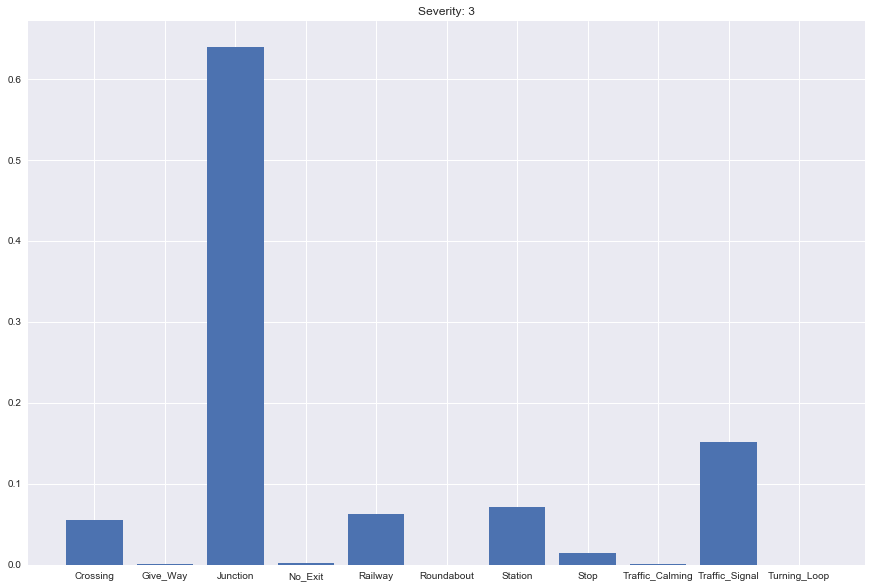

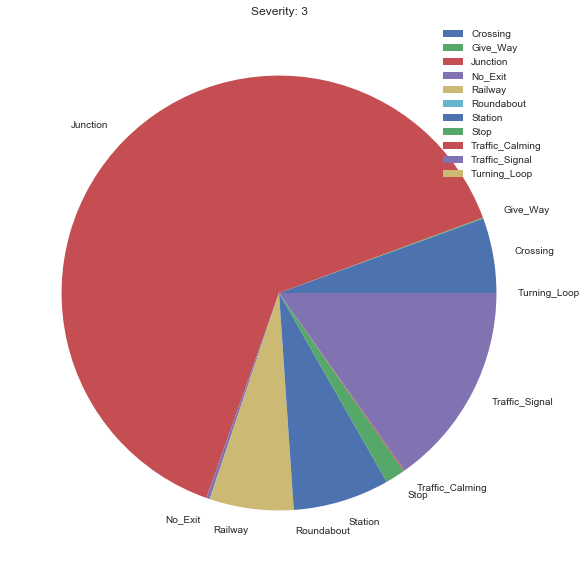

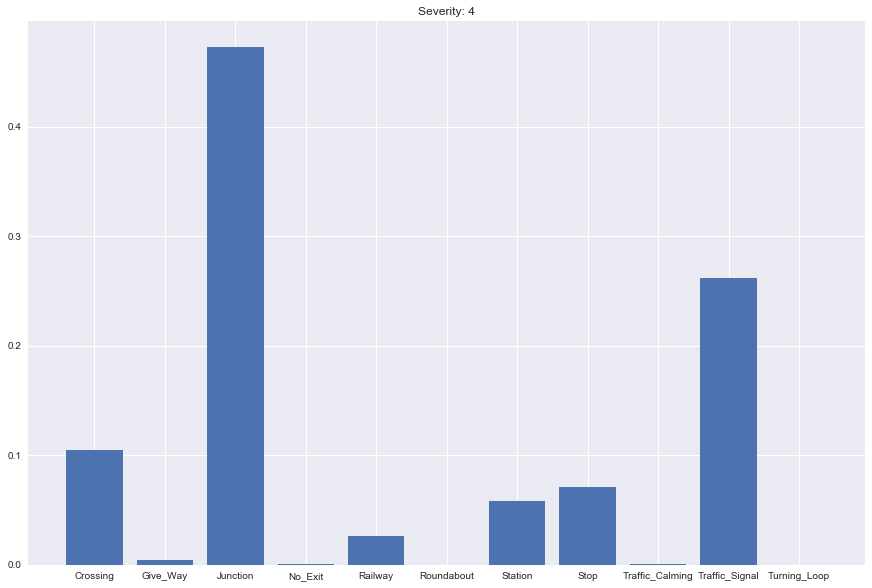

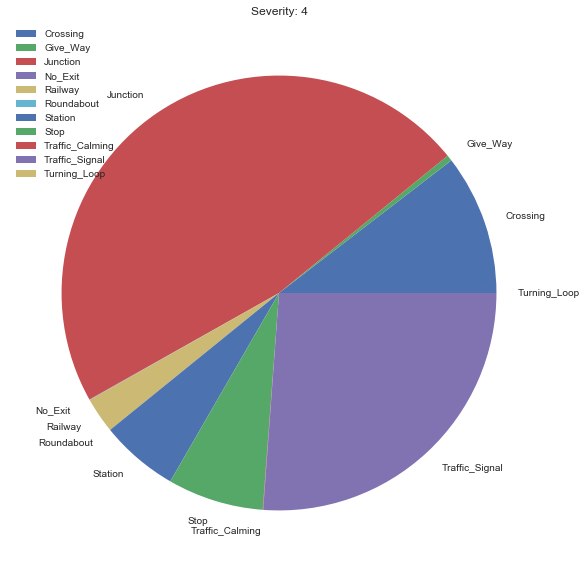

In [10]:
plot_for_sign.plot_signs(cal_data,'./pics/signs/')

# Population Density Analysis

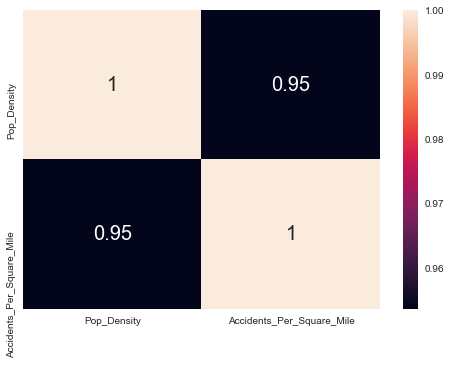

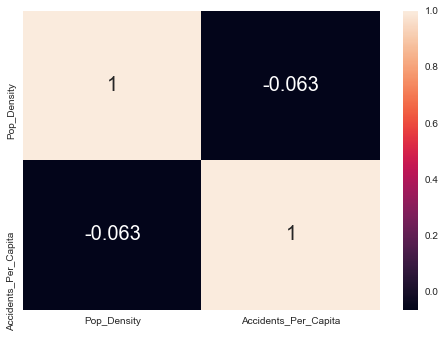

In [11]:

plot_for_capita.plot_capita_map(cal_data,'./pics/capita/')

### Accidents Per Capita

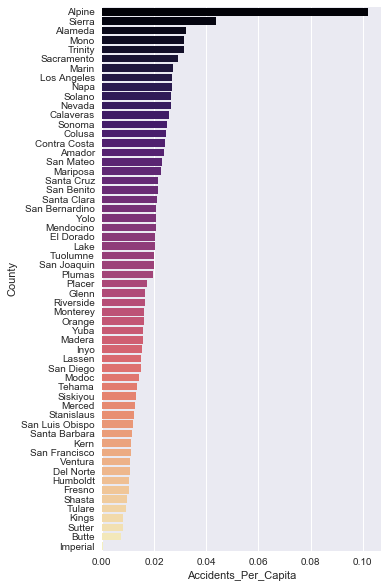

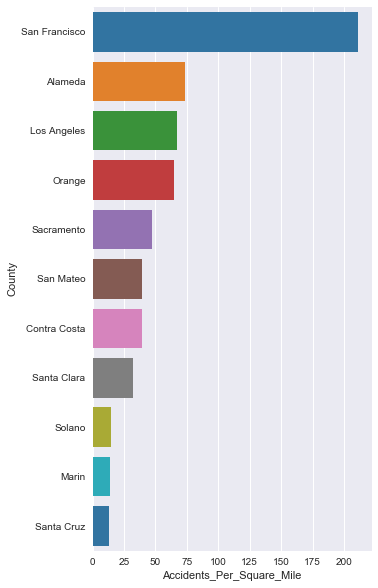

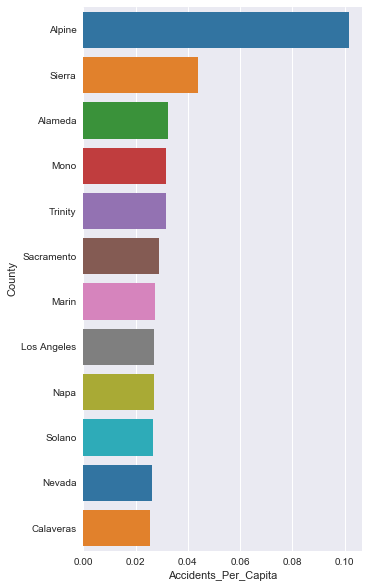

In [12]:
plot_for_capita.plot_Capita(cal_data,'./pics/capita/')

### Accidents Per Square Mile

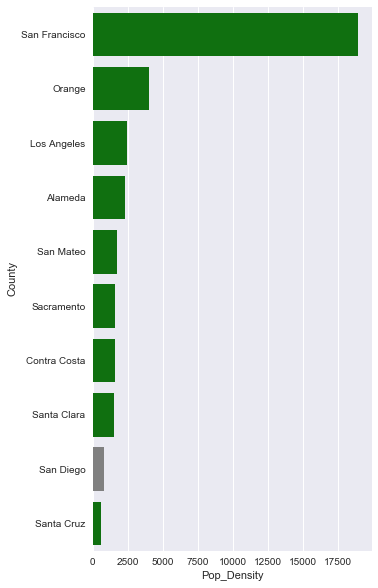

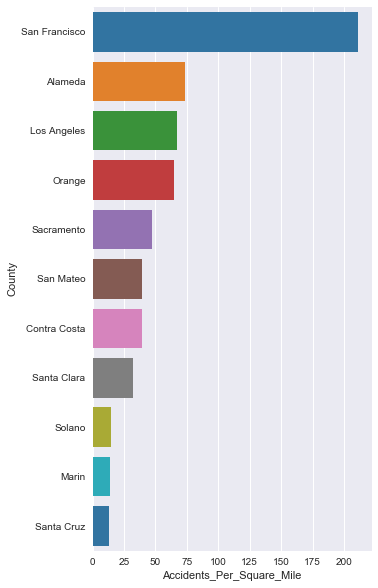

In [13]:
plot_for_capita.plot_Square(cal_data,'./pics/capita/')

# Accident Heatmap

In [18]:
cal_data['count'] = 1
heat_map = folium.Map(location = [36.7783,-119.4179],zoom_start=6)
HeatMap(data=cal_data[['Start_Lat', 'Start_Lng', 'count']].groupby(['Start_Lat', 'Start_Lng']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(heat_map)
display(heat_map)

C:\Users\linkx\.conda\envs\py36\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
### Pie Charts 


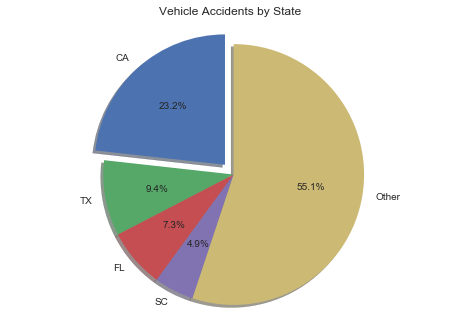

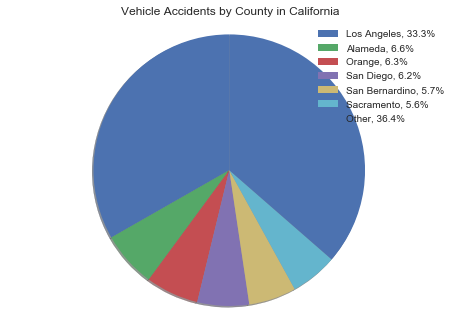

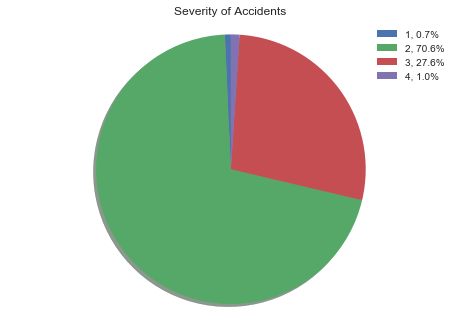

In [19]:
pie_charts.state_pie(data,'./pics/pie_charts/')
pie_charts.county_pie(cal_data,'./pics/pie_charts/')
pie_charts.severity_pie(cal_data,'./pics/pie_charts/')

In [ ]:
### Locations wWith Most Accidents

In [22]:
#Location with most accidents within 100 yards in all of CA
neighbors_coords=find_locations.find_most_accidents(data,100)
print('Coordinates: ',neighbors_coords[1], 'with ',neighbors_coords[0],' accidents')



area with max neighbors of:  720  at list index:  2065512  with coords:  (37.808487, -122.366737)
Coordinates:  (37.808487, -122.366737) with  720  accidents


In [23]:
#Location with most accidents within 50 yards in all of San Diego
neighbors_coords=find_locations.find_most_accidents(data[data['County']=='San Diego'],50)
print('Coordinates: ',neighbors_coords[1], 'with ',neighbors_coords[0],' accidents')



area with max neighbors of:  165  at list index:  42633  with coords:  (33.176952, -117.351227)
Coordinates:  (33.176952, -117.351227) with  165  accidents


In [24]:
#Location with most accidents within 50 yards in all of La Jolla
neighbors_coords=find_locations.find_most_accidents(data[data['City']=='La Jolla'],50)
print('Coordinates: ',neighbors_coords[1], 'with ',neighbors_coords[0],' accidents')

area with max neighbors of:  115  at list index:  526  with coords:  (32.87556, -117.22873)
Coordinates:  (32.87556, -117.22873) with  115  accidents
